# Source Code Analysis

## Initialization

### Load Data

In [70]:
import base64
import pandas as pd
from bson.objectid import ObjectId
from singleton_decorator import singleton
from pymongo import MongoClient, WriteConcern
from sklearn.utils import random


seed=77

class Cryptor:
    @staticmethod
    def encode(target):
        b = base64.b64encode(f'sscd={target}'.encode("utf-8"))
        return str(b, "utf-8")

    @staticmethod
    def decode(target):
        return str(base64.b64decode(target), "utf-8")[5:]


@singleton
class MongoEngine:
    def __init__(self):
        ip = 'localhost'
        port = 27017
        user_name = 'sscd'
        password = 'c3NjZD1jM05qWkQxemMyTmtjSGRr'
        db_name = 'webpage_snapshot_repository'
        doc_name = 'webpage'

        password = Cryptor.decode(password)
        password = Cryptor.decode(password)

        self._mongo_client = MongoClient(ip, port)
        wc_majority = WriteConcern("majority", wtimeout=1000)
        self._webpage = self._mongo_client.get_database(db_name, write_concern=wc_majority)[doc_name]

    def find(self, *query):
        cursor = self._webpage.find(*query)
        result = None
        try:
            result = pd.DataFrame(list(cursor))
        finally:
            cursor.close()
        return result

    def close(self):
        self._mongo_client.close()

    def __exit__(self):
        self.close()

def get_sample_urls(portion, seed):
    engine = MongoEngine()
    ids = engine.find({"scraped": True}, {"_id": 1})

    rnd_idx = random.sample_without_replacement(
        n_population=len(ids),
        n_samples=int(len(ids) * portion),
        random_state=seed)
    ids = ids.iloc[rnd_idx,:] \
        .applymap(ObjectId) \
        .values \
        .squeeze() \
        .tolist()
    result = engine.find({"_id":{ "$in": ids}})

    return result


df = get_sample_urls(.5, seed)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37248 entries, 0 to 37247
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   _id                37248 non-null  object
 1   url                37248 non-null  object
 2   scheme             37248 non-null  object
 3   netloc             37248 non-null  object
 4   path               37248 non-null  object
 5   params             37248 non-null  object
 6   status             37248 non-null  object
 7   scraped            37248 non-null  bool  
 8   html_text          33217 non-null  object
 9   snapshot_img_path  33217 non-null  object
 10  timestamp          37242 non-null  object
 11  comment            69 non-null     object
dtypes: bool(1), object(11)
memory usage: 3.2+ MB


### Train Test Split

In [71]:
from sklearn.model_selection import train_test_split, cross_val_score, ShuffleSplit

X_train, X_test = train_test_split(df, test_size=0.3, random_state=seed)

def extract_dv(df):
    return df.status == 'SUCCESS'

display(extract_dv(X_train).head())
display(extract_dv(X_test).head())

18530    True
21965    True
13134    True
31396    True
4269     True
Name: status, dtype: bool

17638     True
8465     False
27966     True
5158     False
34482     True
Name: status, dtype: bool

## Feature Engineering - First Round

In [72]:
df.head()


,_id,url,scheme,netloc,path,params,status,scraped,html_text,snapshot_img_path,timestamp,comment
0,5e8d898d9b3178616a777b67,https://us.sagepub.com/en-us/nam/open-access-a...,https,us.sagepub.com,/en-us/nam/open-access-at-sage,,SUCCESS,True,"<html xmlns=""http://www.w3.org/1999/xhtml"" xml...",/Users/ukgang/Desktop/github/website_quality/s...,20200408143445,NaN
1,5e8d898d9b3178616a777b69,http://www.r-project.org/,http,www.r-project.org,/,,SUCCESS,True,"<html lang=""en""><head>\n <meta charset=""utf...",/Users/ukgang/Desktop/github/website_quality/s...,20200408143452,NaN
2,5e8d898d9b3178616a777b6e,http://www.un.org/NewLinks/older/99/older.htm,http,www.un.org,/NewLinks/older/99/older.htm,,SUCCESS,True,"<html dir=""ltr"" lang=""en"" class=""js""><head pro...",/Users/ukgang/Desktop/github/website_quality/s...,20200408143455,NaN
3,5e8d898e9b3178616a777b75,http://news.bbc.co.uk/2/hi/health/7354818.stm,http,news.bbc.co.uk,/2/hi/health/7354818.stm,,SUCCESS,True,"<html xml:lang=""en-GB"" xmlns=""http://www.w3.or...",/Users/ukgang/Desktop/github/website_quality/s...,20200408143458,NaN
4,5e8d898e9b3178616a777b77,http://www.fao.org/ag/againfo/resources/docume...,http,www.fao.org,/ag/againfo/resources/documents/AH/PPR_flyer.pdf,,SUCCESS,True,<html><head></head><body></body></html>,/Users/ukgang/Desktop/github/website_quality/s...,20200408143441,NaN


In [73]:
def print_uniqueValue(df):
    df_unique = pd.DataFrame()
    for col_name in df.columns:
        df_unique[col_name] = [len(df[col_name].unique())]

    df_unique['total'] = [len(df)]
    df_unique.index = ['unique count']
    display(df_unique.T)

print_uniqueValue(df)

,unique count
_id,37248
url,37248
scheme,3
netloc,14687
path,30602
params,21
status,3
scraped,1
html_text,24935
snapshot_img_path,31461


### Features in URL

#### Length of the url hierarchy

In [74]:
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator,TransformerMixin
pd.options.mode.chained_assignment = None


class URLLengthCounter(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x
        result.loc[:,'url_length'] = result['url'].apply(self._get_length)
        return result

    def _get_length(self, url):
        return len(url)


pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
])

result = pipe.transform(X_train)

display(result[['url', 'url_length']].head(5))

,url,url_length
18530,http://dx.doi.org/10.1016/j.pain.2004.08.008,44
21965,http://whoindia.org/LinkFiles/Essential_Medici...,81
13134,http://dx.doi.org/10.1002/1097-0355,35
31396,http://www.pcori.org/assets/2013/11/PCORI-Meth...,64
4269,http://www.iarc.fr/en/publications/pdfs-online...,79


#### Depth of the url hierarchy

In [75]:
class URLDepthCounter(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x
        result.loc[:,'url_depth'] = result['path'].apply(self._get_depth)
        return result

    def _get_depth(self, path):
        last_idx = path.rindex('/')
        if last_idx + 1 < len(path):
            last_idx = len(path)
        return path[:last_idx].count('/')

pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
])

result = pipe.transform(X_train)

display(result[['path', 'url_depth']].head(5))

,path,url_depth
18530,/10.1016/j.pain.2004.08.008,2
21965,/LinkFiles/Essential_Medicine_List_Essential-M...,2
13134,/10.1002/1097-0355,2
31396,/assets/2013/11/PCORI-Methodology-Report.pdf,4
4269,/en/publications/pdfs-online/prev/handbook14/h...,6


#### Has WWW subdomain 

In [76]:
class HasWWWConverter(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x
        result.loc[:, 'has_www'] = result['netloc'].apply(self._has_www)
        return result

    def _has_www(self, domain):
        return int(domain.startswith('www.'))


pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
])

result = pipe.transform(X_train)

display(result[['netloc', 'has_www']].head(5))

,netloc,has_www
18530,dx.doi.org,0
21965,whoindia.org,0
13134,dx.doi.org,0
31396,www.pcori.org,1
4269,www.iarc.fr,1


#### Level of the Subdomain

In [77]:
class SubdomainLevelCounter(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x
        result.loc[:, 'subdomain_level'] = result['netloc'].apply(self._get_level)
        return result

    def _get_level(self, domain):
        return domain.count('.')


pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
])

result = pipe.transform(X_train)

display(result[['netloc', 'subdomain_level']].head(5))

,netloc,subdomain_level
18530,dx.doi.org,2
21965,whoindia.org,1
13134,dx.doi.org,2
31396,www.pcori.org,2
4269,www.iarc.fr,2


#### Number of HTTP-Get parameters

In [78]:
import numpy as np


class RequestParameterCounter(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x
        result['params'] = result['params'].replace(np.nan, '', regex=True)
        result.loc[:, 'param_cnt'] = result['params'].apply(self._count_param)
        return result

    def _count_param(self, params):
        if params is '':
            return 0
        return params.count('&') + 1

pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
])

result = pipe.transform(X_train)

display(result[['params', 'param_cnt']].head(5))

,params,param_cnt
18530,,0
21965,,0
13134,,0
31396,,0
4269,,0


#### Domain Suffix

In [79]:
!pip3 install feature_engine

In [80]:
from feature_engine import categorical_encoders


class DomainSuffixBuilder(BaseEstimator, TransformerMixin):
    def __init__(self):
        self._suffix_mapping = None

    def fit(self,x,y=None):
        return self
        
    def transform(self,x,y=None):
        result = x
        # Remove incorrect urls
        result = result[result['netloc'].apply(lambda x: '.' in x)]
        result.loc[:, 'suffix'] = result.netloc.apply(DomainSuffixBuilder._get_url_suffix)
        result.loc[:, 'is_port_access'] = result.suffix.apply(DomainSuffixBuilder._is_port_access)
        result.loc[:, 'suffix_idx'] = result.suffix.apply(DomainSuffixBuilder._clean_url_suffix)
        encoder = categorical_encoders.CountFrequencyCategoricalEncoder(
            encoding_method='frequency',
            variables=['suffix'])
        result = encoder.fit_transform(result)
        self._suffix_dict = encoder.encoder_dict_['suffix']
        return result

    @property
    def suffix_dict(self):
        return self._suffix_dict

    @staticmethod
    def _get_url_suffix(url):
        last_idx = url.rindex('.')
        return url[last_idx + 1:]

    @staticmethod
    def _clean_url_suffix(url):
        return url.split(':')[0]

    @staticmethod
    def _is_port_access(suffix):
        return int(len([token for token in suffix.split(':') if token.strip() != ''])>1)


pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
])

result = pipe.transform(X_train)


display(result[['netloc', 'is_port_access', 'suffix', 'suffix_idx']].head(5))
pipe.steps[-1][1].suffix_dict

,netloc,is_port_access,suffix,suffix_idx
18530,dx.doi.org,0,0.352025,org
21965,whoindia.org,0,0.352025,org
13134,dx.doi.org,0,0.352025,org
31396,www.pcori.org,0,0.352025,org
4269,www.iarc.fr,0,0.010423,fr


{'org': 0.35202492211838005,
 'com': 0.1720703049882697,
 'gov': 0.12418753124879812,
 'edu': 0.062382216068612745,
 'uk': 0.05380562286065921,
 'int': 0.0266912811045729,
 'net': 0.017999307718933887,
 'jp': 0.017653167185877467,
 'ca': 0.015153263336025537,
 'de': 0.015153263336025537,
 'eu': 0.014768662743740625,
 'au': 0.013384100611514942,
 'fr': 0.010422676050921119,
 'cn': 0.009384254451751856,
 'in': 0.007499711549555786,
 'nl': 0.006268989654244068,
 'ch': 0.004845967462789893,
 'se': 0.004615207107418946,
 'kr': 0.004230606515134033,
 'it': 0.004038306218991578,
 'no': 0.003653705626706665,
 'dk': 0.003653705626706665,
 'es': 0.0029998846198223145,
 'pl': 0.0026922041459943847,
 'info': 0.0026152840275374023,
 'be': 0.00253836390908042,
 'br': 0.0024614437906234376,
 'tw': 0.0023845236721664552,
 'il': 0.002307603553709473,
 'nz': 0.0019230029614245607,
 'ir': 0.0018845429021960695,
 'io': 0.001807622783739087,
 'fi': 0.0016153224875966308,
 'us': 0.0014999423099111573,
 'at'

#### Remove the Incorrect Domains

- TLD ranges from 2 to 63

Ref: https://en.wikipedia.org/wiki/Domain_Name_System#cite_ref-rfc1034_1-2

In [81]:
import re


class IncorrectDomainUrlCleaner(BaseEstimator, TransformerMixin):
    def __init__(self):
        # TLD ranges from 2 to 63
        self._regex = re.compile(r'^[a-zA-Z]{2,63}$', re.I)

    def fit(self,x,y=None):
        return self
        
    def transform(self,x,y=None):
        result = x
        result.loc[:, 'is_correct'] = result.suffix_idx.apply(self._is_correct)
        result = result[result.is_correct]
        result = result.drop('is_correct', axis=1)
        return result

    def _is_correct(self, domain_suffix):
        return True if self._regex.match(domain_suffix) else False


pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
])

result = pipe.transform(X_train)

print(f'Before changes: {len(X_train)}')
print(f'After changes: {len(result)}')


Before changes: 26073
After changes: 25927


#### Protocol Type Conversion

In [82]:
from feature_engine import categorical_encoders


class ColumnRenamer(BaseEstimator, TransformerMixin):
    def __init__(self, mapping):
        self._mapping = mapping

    @property
    def mapping(self):
        return self._mapping

    def fit(self,x,y=None):
        return self
        
    def transform(self,x,y=None):
        result = x
        self._mapping = {key: value for key, value in self._mapping.items() if key in result.columns}
        result = result.rename(columns=self._mapping)
        return result

pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
])

result = pipe.transform(X_train)

display(result[['url', 'protocol_type']].head(5))

,url,protocol_type
18530,http://dx.doi.org/10.1016/j.pain.2004.08.008,http
21965,http://whoindia.org/LinkFiles/Essential_Medici...,http
13134,http://dx.doi.org/10.1002/1097-0355,http
31396,http://www.pcori.org/assets/2013/11/PCORI-Meth...,http
4269,http://www.iarc.fr/en/publications/pdfs-online...,http


## EDA

In [83]:
print_uniqueValue(result)
result.info()

,unique count
_id,25927
url,25927
protocol_type,3
netloc,11024
path,21467
params,13
status,3
scraped,1
html_text,17569
snapshot_img_path,21881


<class 'pandas.core.frame.DataFrame'>
Int64Index: 25927 entries, 18530 to 8799
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   _id                25927 non-null  object 
 1   url                25927 non-null  object 
 2   protocol_type      25927 non-null  object 
 3   netloc             25927 non-null  object 
 4   path               25927 non-null  object 
 5   params             25927 non-null  object 
 6   status             25927 non-null  object 
 7   scraped            25927 non-null  bool   
 8   html_text          23133 non-null  object 
 9   snapshot_img_path  23133 non-null  object 
 10  timestamp          25921 non-null  object 
 11  comment            51 non-null     object 
 12  url_length         25927 non-null  int64  
 13  url_depth          25927 non-null  int64  
 14  has_www            25927 non-null  int64  
 15  subdomain_level    25927 non-null  int64  
 16  param_cnt          

In [261]:
import plotly

import plotly.graph_objects as go
from plotly.subplots import make_subplots


pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
])

result = pipe.transform(X_train)

non_binary_result = result[['protocol_type', 'url_length', 'url_depth', 'subdomain_level', 'param_cnt', 'suffix_idx']]

def plot_distribution(data, title, height=1200, width=800):
    fig = make_subplots(rows=len(data.columns), cols=1,
                    subplot_titles=data.columns)

    for idx, col_name in enumerate(data.columns):
        fig.add_trace(go.Histogram(x=data[col_name], name=col_name), row=idx + 1, col=1)


    fig.update_layout(height=height, width=width, title_text=title)
    return fig

plot_distribution(non_binary_result, "Non Binary Features Distribution")

In [85]:
binary_result = result[['status', 'has_www', 'is_port_access']]

plot_distribution(binary_result, "Binary Features Distribution")

Most of the non-binary feature are right skewed, it is necessary to apply the standard scaler at the later process. 

## Modeling

### Data Cleaning

#### Convert Timestamp to the Inversed Number of Month From the Available Time

<b><font color='red'> Timesamp will not be used in the logistic regression, it is directly correlated with the dependent variable </font></b>

In [86]:
import time
import datetime


class TimeseriesConverter(BaseEstimator, TransformerMixin):
    def __init__(self):
        self._scraped_dt = datetime.datetime.strptime('20200513132015', "%Y%m%d%H%M%S")

    def fit(self,x,y=None):
        return self
        
    def transform(self,x,y=None):
        result = x
        result.loc[:, 'timestamp'] = result.timestamp.astype(str)
        result = result.dropna()
        result.loc[:, 'timestamp'] = result.timestamp.apply(lambda x: datetime.datetime.strptime(x, "%Y%m%d%H%M%S"))
        result.loc[:, 'timestamp_coef'] = 1/(self._scraped_dt - result.timestamp).apply(lambda x: x.days)
        return result

pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('timeseries_converter', TimeseriesConverter()),
])

result = pipe.transform(X_train)

result.timestamp_coef.head()

34555    0.003509
35986    0.005155
36766    0.005076
34411    0.004049
36159    0.000669
Name: timestamp_coef, dtype: float64

#### Remove redundant features

In [87]:
class FeatureRemover(BaseEstimator, TransformerMixin):
    def __init__(self, features):
        self._removed_features = None
        self._features = features

    @property
    def removed_features(self):
        return self._removed_features

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x
        self._removed_features = [col_name for col_name in self._features if col_name in result.columns]
        result = result.drop(self._removed_features, axis=1)
        return result


class FeaturePicker(BaseEstimator, TransformerMixin):
    def __init__(self, features):
        self._picked_features = None
        self._features = features

    @property
    def picked_features(self):
        return self._picked_features

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x
        self._picked_features = [col_name for col_name in self._features if col_name in result.columns]
        result = result[self._picked_features]
        return result


pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
#     ('timeseries_converter', TimeseriesConverter()),
    ('feature_picker', FeaturePicker(['protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix',
                                        'timestamp_coef',
                                        'is_port_access',
                                        'status',
                                       ])),
])

result = pipe.transform(X_train)

result.columns

Index(['protocol_type', 'url_depth', 'has_www', 'subdomain_level', 'param_cnt',
       'suffix', 'is_port_access', 'status'],
      dtype='object')

#### Miscellaneous Clean Up

- Standardize variance
- Convert Categorical Feature into Frequency Based Numberical Index 
- Remove low variance features

In [88]:
from itertools import compress
from sklearn import feature_selection


class LowVarianceRemover(BaseEstimator, TransformerMixin):
    def __init__(self, threshold):
        self._p = threshold
        self._bi_vt = feature_selection.VarianceThreshold(threshold=threshold*(1-threshold))
        self._regular_vt = feature_selection.VarianceThreshold(threshold=threshold)
        self._dropped_columns = list()

    @property
    def threshold(self):
        return self._threshold

    @property
    def dropped_columns(self):
        return self._dropped_columns

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        result = x

        df_unique = pd.DataFrame()
        for col_name in result.columns:
            if 'status' != col_name:
                df_unique[col_name] = [len(result[col_name].unique())]

        df_unique.index = ['unique count']
        df_unique = df_unique.T.squeeze()

        bi_columns = df_unique[df_unique == 2].index.tolist()
        regular_columns = df_unique[df_unique != 2].index.tolist()

        if len(bi_columns) >0:
            self._bi_vt.fit(result[bi_columns])
            bi_mask = self._bi_vt.variances_ < self._p * (1 - self._p)            
            self._dropped_columns = self._dropped_columns + list(compress(bi_columns, bi_mask))
        if len(regular_columns) >0 :
            self._regular_vt.fit(result[regular_columns])
            regular_mask = self._regular_vt.variances_ < self._p
            self._dropped_columns = self._dropped_columns + list(compress(regular_columns, regular_mask))

        if len(self._dropped_columns) > 0:
            remover = FeatureRemover(self._dropped_columns)
            result = remover.transform(result)
        return result


pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
#     ('timeseries_converter', TimeseriesConverter()),
    ('feature_picker', FeaturePicker(['protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix',
                                        'timestamp_coef',
                                        'is_port_access',
                                        'status',
                                       ])),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['protocol_type'])),
    ('low_variance_remover', LowVarianceRemover(0.01))

])


result = pipe.fit_transform(X_train)


print(f'Before transform: {X_train.columns}\n')
print(f'After transform: {result.columns}\n')
print(f'Dropped columns: {pipe.steps[-1][1].dropped_columns}')

Before transform: Index(['_id', 'url', 'scheme', 'netloc', 'path', 'params', 'status', 'scraped',
       'html_text', 'snapshot_img_path', 'timestamp', 'comment', 'url_length',
       'url_depth', 'has_www', 'subdomain_level', 'param_cnt'],
      dtype='object')

After transform: Index(['protocol_type', 'url_depth', 'has_www', 'subdomain_level', 'suffix',
       'status'],
      dtype='object')

Dropped columns: ['param_cnt', 'is_port_access']


The port indicator is wiped out, but I believe this could be a reason to explain the availability of the url resource, so I will separately build a subset to analyze that part later.

#### Add Sklearn Build-in Function

In [89]:
from sklearn import preprocessing


class CustomizedStandardizer(BaseEstimator, TransformerMixin):
    def __init__(self, norm='l2'):
        self._pipe = Pipeline([
            ('normalizer', preprocessing.Normalizer(norm=norm, copy=True)),
            ('standard_scaler', preprocessing.StandardScaler()),

        ])
        self._columns = None

    @property
    def columns(self):
        return self._columns

    def fit(self,x,y=None):
        return self

    def transform(self,x,y=None):
        self._columns = x.drop('status', axis=1).columns
        self._columns = [*self._columns, 'status']
        result = self._pipe.fit_transform(x.drop('status', axis=1))
        dv = x.status.apply(lambda v: 1 if 'SUCCESS' == v else 0).tolist()
        dv = np.array([dv]).T
        result = np.append(result, dv, axis=1)
        return result

pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
#     ('timeseries_converter', TimeseriesConverter()),
    ('feature_picker', FeaturePicker(['protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix',
                                        'timestamp_coef',
                                        'is_port_access',
                                        'status'
                                       ])),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['protocol_type'])),
    ('low_variance_remover', LowVarianceRemover(0.01)),
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

result = pipe.fit_transform(X_train)

result = pd.DataFrame(result, columns= pipe.steps[-1][1].columns)

plot_distribution(result, "Standardized Features Distribution")

#### Logistic Regression

In [90]:
import gc
import multiprocessing

import warnings
warnings.filterwarnings("ignore")


cpu_cnt = multiprocessing.cpu_count()
allocated_cpu = cpu_cnt
print(f"Allocated {allocated_cpu} CPUs")
gc.collect()

Allocated 16 CPUs


19571

In [99]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.naive_bayes import GaussianNB


class AnalysisEngineBuilder:

    def __init_(self):
        self._X_train = None
        self._y_train = None
        self._X_test = None
        self._y_test = None
        self._param_grid = None
        self._engine = None
    def set_X_train(self, X_train):
        self._X_train = X_train
        return self
    def set_y_train(self, y_train):
        self._y_train = y_train
        return self
    def set_X_test(self, X_test):
        self._X_test = X_test
        return self
    def set_y_test(self, y_test):
        self._y_test = y_test
        return self
    def set_param_grid(self, param_grid):
        self._param_grid = param_grid
        return self
    def set_engine(self, engine):
        self._engine = engine
        return self
    def build(self):
        return AnalysisEngineBuilder._AnalysisEngine(self._X_train, self._y_train, self._X_test, self._y_test, self._param_grid, self._engine)

    class _AnalysisEngine:
        def __init__(self, X_train, y_train, X_test, y_test, param_grid, engine):
            self._X_train = X_train
            self._y_train = y_train
            self._X_test = X_test
            self._y_test = y_test
            self._param_grid = param_grid
            self._engine = engine
            self._grid = GridSearchCV(self._engine, self._param_grid, cv=10, scoring='accuracy')
            self._pred = None
            self._pred_prob = None
            self._accuracy = None
            self._roc = None
            self._tpr = None
            self._fpr = None
        @property
        def grid_search_result(self):
            return pd.DataFrame(self._grid.cv_results_)
        @property
        def accuracy(self):
            return self._accuracy
        @property
        def roc(self):
            return self._roc
        @property
        def tpr(self):
            return self._tpr
        @property
        def fpr(self):
            return self._fpr
        @property
        def threshold(self):
            return self._threshold
        def analyze(self):
            self._grid.fit(self._X_train, self._y_train)
            self._pred = self._grid.predict(self._X_test)
            self._fpr, self._tpr, self._threshold = roc_curve(self._y_test, self._pred)
            try:
                self._pred_prob = self._grid.predict_proba(self._X_test)
                self._fpr, self._tpr, self._threshold = roc_curve(self._y_test, pd.DataFrame(self._pred_prob)[1])
            except AttributeError as ae:
                pass
            self._accuracy = accuracy_score(self._y_test, self._pred)
            self._roc = roc_auc_score(self._y_test, self._pred)

            return self._grid

        def show_performance(self):
            print(f"ROC/AUC: {round(self._roc*100, 2)}%")
            print()
            print(classification_report(self._y_test, self._pred, target_names=["Valid Url","Invalid"]))

In [100]:
import matplotlib


class Visualizer():
    @staticmethod
    def group_plot_roc_curve(title, data_group):
        plt.clf()
        plt.figure(figsize=(5, 5), dpi=80)

        x = [0.0, 1.0]
        plt.plot(x, x, linestyle='dashed', color='red', linewidth=2, label='Naive prediction (Random guess)')
        for idx, group in enumerate(data_group):
            fpr = group[0]
            tpr = group[1]
            label = group[2]
            linestyle= 'solid'
            if idx % 2 == 1:
                linestyle= 'dashed'
            plt.plot(fpr, tpr, linestyle=linestyle, linewidth=2, label=label)

        plt.xlim(0.0, 1.0)
        plt.ylim(0.0, 1.0)
        plt.xlabel("FPR", fontsize=14)
        plt.ylabel("TPR", fontsize=14)

        plt.legend(fontsize=10, loc='best')

        plt.title(title, fontsize=14)
        plt.tight_layout()

        display()

    @staticmethod
    def plot_performance(data,
                            legend_type_name,
                            x_axis_name,
                            upper_y_label,
                            lower_y_label,
                            title):
        plt.clf()
        f, ax = plt.subplots(2, 1, figsize=(15,8))
        legends = data[legend_type_name].unique()
        for idx, legend in enumerate(legends):
            _data = data[data[legend_type_name]==legend]
            ax[0].plot(_data[x_axis_name], _data[upper_y_label], linewidth=2, label=f'{legend_type_name}: {legend}')
            ax[0].set_xlabel(x_axis_name, fontsize=15)
            ax[0].set_ylabel(upper_y_label.upper(), fontsize=15)
            ax[0].legend(fontsize=10, loc='upper right')

            ax[1].plot(_data[x_axis_name], _data[lower_y_label], linewidth=2, label=f'{legend_type_name}: {legend}')
            ax[1].set_xlabel(x_axis_name, fontsize=15)
            ax[1].set_ylabel(lower_y_label.upper(), fontsize=15)
            ax[1].legend(fontsize=10, loc='lower right')

        ax[0].set_title(f"Performance Evaluation of {title}", fontsize=24)
        plt.tight_layout()

        display()

    @staticmethod
    def plot_feature_importance(reg_coef, col_names, title):
        reg_coef = pd.Series(reg_coef, index=col_names)
        reg_coef = reg_coef.sort_values()
        matplotlib.rcParams['figure.figsize'] = (8.0, 10.0)
        reg_coef.plot(kind="barh",)
        plt.title(title, fontsize=15)
    
    @staticmethod
    def plot_importance_trending(X_train, feature_importance_matrix, title):
        feature_importance = feature_importance_matrix.groupby('C').agg(['mean'])[[*X_train.columns]]
        feature_importance.columns = X_train.columns.tolist()
        feature_importance['C'] = feature_importance.index
        
        column_names = X_train.columns
        lbds = feature_importance['C'].tolist()
        coef_matrix = feature_importance[X_train.columns]
        x_lab = 'Lambda'
        y_lab = 'Weight'
        plt.clf()
        plt.figure(figsize=(15, 10))
        for idx, col_name in enumerate(column_names):
            plt.plot(lbds, coef_matrix.iloc[:,idx], 'o-', linewidth=2, label=col_name)
            c = coef_matrix.iloc[0,idx]
            plt.annotate(col_name, (lbds[3], coef_matrix.iloc[3,idx]))

        plt.title(title, fontSize=25)
        plt.xlabel(x_lab)
        plt.ylabel(y_lab)

        plt.legend(loc='upper right')
        plt.tight_layout()
        display()

In [101]:
from concurrent.futures.thread import ThreadPoolExecutor
import warnings
warnings.filterwarnings("ignore")
from concurrent.futures.thread import ThreadPoolExecutor
from sklearn.metrics import hinge_loss


def loss_accuracy_analyze_job_builder(X_train, y_train, X_test, y_test, model_func, param):
    def _analyze_param_combination():
        engine = AnalysisEngineBuilder() \
                    .set_X_train(X_train) \
                    .set_y_train(y_train) \
                    .set_X_test(X_test) \
                    .set_y_test(y_test) \
                    .set_param_grid(param) \
                    .set_engine(model_func) \
                    .build()
        model = engine.analyze()
        
        # Performance scores
        loss = hinge_loss(y_test, pd.DataFrame(model.predict_proba(X_test))[1])
        auc = roc_auc_score(y_test, model.predict(X_test))
        
        coef = pd.Series(model.best_estimator_.coef_[0], index=X_test.columns).to_dict()
        _param = param
        for key, value in param.items():
            _param[key] = value[0]
        return {
            'accuracy': engine.accuracy * 100,
            'loss': loss,
            'auc': auc,
            **coef,
            **_param
        }
    return _analyze_param_combination

# Refactor into the analyzer later on
def calculate_grid_performance(X_train, y_train, X_test, y_test, params, model):
    # build combination list
    combination_list = pd.DataFrame({'dummy': [1]})
    for key, values in params.items():
        combination_list = pd.merge(combination_list, pd.DataFrame({key: values, 'dummy': [1] * len(values)}))
    combination_list.drop('dummy',axis=1, inplace=True)

    # Train and extract scores
    futures = list()
    results = list()
    # Execute models in threads
    with ThreadPoolExecutor(max_workers=allocated_cpu) as executor:
        for combination in combination_list.to_dict('records'):
            combination = {key:[value] for key, value in combination.items()}
            future_model = executor.submit(loss_accuracy_analyze_job_builder(X_train, y_train, X_test, y_test, model, combination))
            futures.append(future_model)
        return pd.DataFrame.from_dict([future.result() for future in futures])

In [102]:
from sklearn.linear_model import LogisticRegression


pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
#     ('timeseries_converter', TimeseriesConverter()),
    ('feature_picker', FeaturePicker(['protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix',
                                        'timestamp_coef',
                                        'is_port_access',
                                        'status'
                                       ])),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['protocol_type'])),
    ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

X = pipe.fit_transform(df)

X_train, X_test = train_test_split(X, test_size=0.3, random_state=seed)

y_train = X_train[:,-1]
X_train = pd.DataFrame(X_train, columns= pipe.steps[-1][1].columns)
X_train = X_train.drop('status', axis=1)
print(X_train.columns)



y_test = X_test[:,-1]
X_test = pd.DataFrame(X_test, columns= pipe.steps[-1][1].columns)
X_test = X_test.drop('status', axis=1)
print(X_test.columns)

start_time = time.time()
param_lr = {
    'l1_ratio': [0, *np.logspace(-3, 0, 1)],
    'C': np.logspace(-3, -1, 1),
    'max_iter': np.arange(10,80,1),
}

lr = LogisticRegression(random_state=seed,
                       penalty='elasticnet',
                       solver='saga',
                       multi_class='ovr',
                       warm_start=False,
                       n_jobs=allocated_cpu,
)


# Start to train model
engine_lr = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_lr) \
    .set_engine(lr) \
    .build()

model_lr = engine_lr.analyze()
engine_lr.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

Index(['protocol_type', 'url_depth', 'has_www', 'subdomain_level', 'suffix'], dtype='object')
Index(['protocol_type', 'url_depth', 'has_www', 'subdomain_level', 'suffix'], dtype='object')
ROC/AUC: 50.0%

              precision    recall  f1-score   support

   Valid Url       0.00      0.00      0.00      1193
     Invalid       0.89      1.00      0.94      9923

    accuracy                           0.89     11116
   macro avg       0.45      0.50      0.47     11116
weighted avg       0.80      0.89      0.84     11116

--- 01 minutes, 35.32 seconds ---


<Figure size 432x288 with 0 Axes>

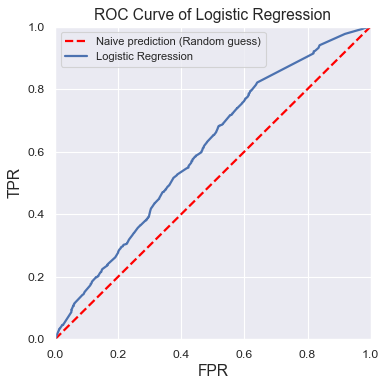

In [135]:
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

Visualizer.group_plot_roc_curve('ROC Curve of Logistic Regression', [
    (engine_lr.fpr, engine_lr.tpr, 'Logistic Regression')
])

In [136]:
param_lr = {
    'l1_ratio': [0, *np.logspace(-3, 0, 5)],
    'C': np.logspace(-3, -1, 5),
    'max_iter': np.arange(10,80,40),
}

lr = LogisticRegression(random_state=seed,
                        penalty='elasticnet',
                        solver='saga',
                        multi_class='ovr',
                        warm_start=False,
                        n_jobs=allocated_cpu,
)

loss_accuracy_matrix = calculate_grid_performance(X_train, y_train, X_test, y_test, param_lr, lr)

<Figure size 432x288 with 0 Axes>

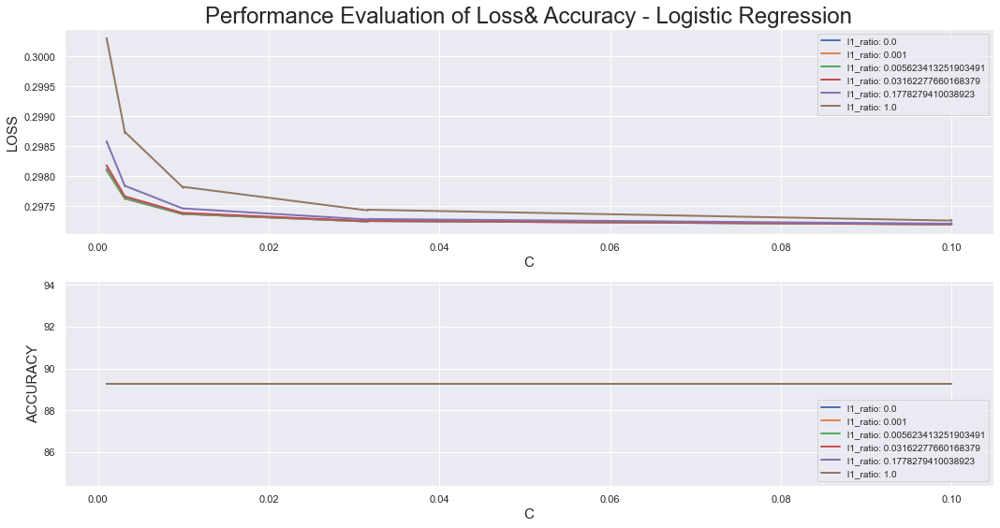

In [137]:
Visualizer.plot_performance(data=loss_accuracy_matrix,
                    legend_type_name='l1_ratio',
                    x_axis_name='C',
                    upper_y_label='loss',
                    lower_y_label='accuracy',
                    title='Loss& Accuracy - Logistic Regression'
)

<Figure size 432x288 with 0 Axes>

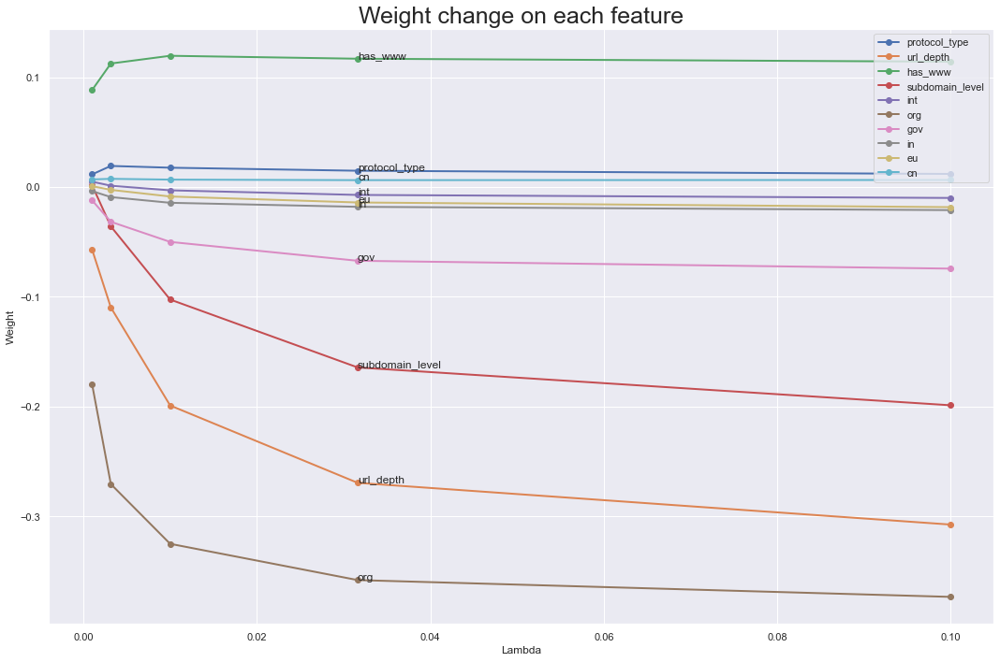

In [138]:
Visualizer.plot_importance_trending(X_train, loss_accuracy_matrix, 'Weight change on each feature')

#### Try encode the suffix index label with logarithm

In [160]:
import math


class LogarithmTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self._columns = columns

    def fit(self,x,y=None):
        return self
        
    def transform(self,x,y=None):
        result = x
        result.loc[:, self._columns] = result[self._columns].applymap(math.log)

        return result

pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('feature_picker', FeaturePicker(['protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix',
                                        'timestamp_coef',
                                        'is_port_access',
                                        'status'
                                       ])),
    ('logarithm_transformer', LogarithmTransformer(['suffix'])),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['protocol_type'])),
    ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

X = pipe.fit_transform(df)

X_train, X_test = train_test_split(X, test_size=0.3, random_state=seed)

y_train = X_train[:,-1]
X_train = pd.DataFrame(X_train, columns= pipe.steps[-1][1].columns)
X_train = X_train.drop('status', axis=1)
print(X_train.columns)



y_test = X_test[:,-1]
X_test = pd.DataFrame(X_test, columns= pipe.steps[-1][1].columns)
X_test = X_test.drop('status', axis=1)
print(X_test.columns)

Index(['protocol_type', 'url_depth', 'has_www', 'subdomain_level', 'suffix'], dtype='object')
Index(['protocol_type', 'url_depth', 'has_www', 'subdomain_level', 'suffix'], dtype='object')


In [116]:
start_time = time.time()
param_lr = {
    'l1_ratio': [0, *np.logspace(-3, 0, 1)],
    'C': np.logspace(-3, -1, 1),
    'max_iter': np.arange(10,80,1),
}

lr = LogisticRegression(random_state=seed,
                       penalty='elasticnet',
                       solver='saga',
                       multi_class='ovr',
                       warm_start=False,
                       n_jobs=allocated_cpu,
)


# Start to train model
engine_lr = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_lr) \
    .set_engine(lr) \
    .build()

model_lr = engine_lr.analyze()
engine_lr.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

ROC/AUC: 50.0%

              precision    recall  f1-score   support

   Valid Url       0.00      0.00      0.00      1193
     Invalid       0.89      1.00      0.94      9923

    accuracy                           0.89     11116
   macro avg       0.45      0.50      0.47     11116
weighted avg       0.80      0.89      0.84     11116

--- 02 minutes, 11.40 seconds ---


#### Try Tong's methd

In [151]:
class DummySuffixDescritizer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self,x,y=None):
        return self
        
    def transform(self,x,y=None):
        result = x
        dummies = pd.get_dummies(result.suffix_idx)
        dummies = FeaturePicker(['int', 'org', 'gov', 'in', 'eu', 'cn']).fit_transform(dummies)
        result = result.drop('suffix_idx', axis = 1).join(dummies, how='inner')

        return result

pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('feature_picker', FeaturePicker(['protocol_type',
                                        'url_depth',
                                        'has_www',
                                        'subdomain_level',
                                        'param_cnt',
                                        'suffix_idx',
                                        'timestamp_coef',
                                        'is_port_access',
                                        'status'
                                       ])),
    ('dummy_suffix_descritizer', DummySuffixDescritizer()),
    ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
        encoding_method='frequency',
        variables=['protocol_type'])),
    ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
    ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

X = pipe.fit_transform(df)

X_train, X_test = train_test_split(X, test_size=0.3, random_state=seed)

y_train = X_train[:,-1]
X_train = pd.DataFrame(X_train, columns= pipe.steps[-1][1].columns)
X_train = X_train.drop('status', axis=1)
print(X_train.columns)



y_test = X_test[:,-1]
X_test = pd.DataFrame(X_test, columns= pipe.steps[-1][1].columns)
X_test = X_test.drop('status', axis=1)
print(X_test.columns)

Index(['protocol_type', 'url_depth', 'has_www', 'subdomain_level', 'int',
       'org', 'gov', 'in', 'eu', 'cn'],
      dtype='object')
Index(['protocol_type', 'url_depth', 'has_www', 'subdomain_level', 'int',
       'org', 'gov', 'in', 'eu', 'cn'],
      dtype='object')


In [134]:
start_time = time.time()
param_lr = {
    'l1_ratio': [0, *np.logspace(-3, 0, 1)],
    'C': np.logspace(-3, -1, 1),
    'max_iter': np.arange(10,80,1),
}

lr = LogisticRegression(random_state=seed,
                       penalty='elasticnet',
                       solver='saga',
                       multi_class='ovr',
                       warm_start=False,
                       n_jobs=allocated_cpu,
)


# Start to train model
engine_lr = AnalysisEngineBuilder() \
    .set_X_train(X_train) \
    .set_y_train(y_train) \
    .set_X_test(X_test) \
    .set_y_test(y_test) \
    .set_param_grid(param_lr) \
    .set_engine(lr) \
    .build()

model_lr = engine_lr.analyze()
engine_lr.show_performance()

t = str(datetime.timedelta(seconds=time.time() - start_time)).split(':')
print("--- %s minutes, %.2f seconds ---" % (t[1], float(t[2])))

ROC/AUC: 50.0%

              precision    recall  f1-score   support

   Valid Url       0.00      0.00      0.00      1193
     Invalid       0.89      1.00      0.94      9923

    accuracy                           0.89     11116
   macro avg       0.45      0.50      0.47     11116
weighted avg       0.80      0.89      0.84     11116

--- 03 minutes, 57.51 seconds ---


### Feature Engineering - Second Round

#### Features in source code

- Restore the test data

In [165]:
X_train, X_test = train_test_split(df, test_size=0.3, random_state=seed)

display(extract_dv(X_train).head())
display(extract_dv(X_test).head())

18530    True
21965    True
13134    True
31396    True
4269     True
Name: status, dtype: bool

17638     True
8465     False
27966     True
5158     False
34482     True
Name: status, dtype: bool

##### Code length(kb)

In [179]:
class SourceCodeByteCounter(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self,x,y=None):
        return self
        
    def transform(self,x,y=None):
        result = x
        result['code_size'] = result.html_text \
            .replace(np.nan, '', regex=True) \
            .astype(str) \
            .apply(len)

        return result

pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('source_code_byte_counter', SourceCodeByteCounter()),
    ('feature_picker', FeaturePicker(['protocol_type',
                                      'url_depth',
                                      'has_www',
                                      'subdomain_level',
                                      'param_cnt',
                                      'suffix',
                                      'timestamp_coef',
                                      'is_port_access',
                                      'status',
                                      'code_size'
                                       ])),
#     ('logarithm_transformer', LogarithmTransformer(['suffix'])),
#     ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
#         encoding_method='frequency',
#         variables=['protocol_type'])),
#     ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
#     ('standard_scaler', CustomizedStandardizer(norm='l2')),

])


result = pipe.fit_transform(X_train)

result.code_size.head()

18530    69461
21965       39
13134     4843
31396       39
4269     27429
Name: code_size, dtype: int64

#### Text Mining

In [240]:
class BeautifulSoupParserBuilder:

    class _BeautifulSoupParser(BaseEstimator, TransformerMixin):
        def __init__(self,_lambda_pair):
            self._lambda_pair = _lambda_pair

        def fit(self,x,y=None):
            return self

        def transform(self,x,y=None):
            result = x
            for col_name, func in self._lambda_pair.items():
                result[col_name] = result.html_text \
                    .replace(np.nan, '', regex=True) \
                    .apply(lambda html_doc: BeautifulSoup(html_doc, 'html.parser')) \
                    .apply(func)

            return result

    def __init__(self):
        self._lambda_pair = dict()

    def add_lambda(self, column_name, lbd):
        self._lambda_pair[column_name] = lbd
        return self

    def build(self):
        return BeautifulSoupParserBuilder._BeautifulSoupParser(self._lambda_pair)



##### Title Length

In [225]:
from bs4 import BeautifulSoup


def get_title_length(soup):
    return len(soup.title.string) if soup.title else 0

html_parser = BeautifulSoupParserBuilder() \
    .add_lambda('title_length', get_title_length) \
    .build()

pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('source_code_byte_counter', SourceCodeByteCounter()),
    ('html_parser', html_parser),
    ('feature_picker', FeaturePicker(['protocol_type',
                                      'url_depth',
                                      'has_www',
                                      'subdomain_level',
                                      'param_cnt',
                                      'suffix',
                                      'timestamp_coef',
                                      'is_port_access',
                                      'status',
                                      'code_size',
                                      'title_length',
                                       ])),
#     ('logarithm_transformer', LogarithmTransformer(['suffix'])),
#     ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
#         encoding_method='frequency',
#         variables=['protocol_type'])),
#     ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
#     ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

result = pipe.fit_transform(X_train.iloc[:10,:])

result.title_length.head()

18530    76
21965     0
13134    20
31396     0
4269     21
Name: title_length, dtype: int64

###### No of denpendency on JS library

- Extract this feature later when running the association rule.

###### No of JS files

In [241]:
def count_internal_js_lib(soup):
    sources=soup.findAll('script',{"src":True})
    return len([0 for source in sources if not source['src'].startswith('http')])

def count_external_js_lib(soup):
    sources=soup.findAll('script',{"src":True})
    return len([0 for source in sources if source['src'].startswith('http')])

html_parser = BeautifulSoupParserBuilder() \
    .add_lambda('title_length', get_title_length) \
    .add_lambda('internal_js_cnt', count_internal_js_lib) \
    .add_lambda('external_js_cnt', count_external_js_lib) \
    .build()

pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('source_code_byte_counter', SourceCodeByteCounter()),
    ('html_parser', html_parser),
    ('feature_picker', FeaturePicker(['protocol_type',
                                      'url_depth',
                                      'has_www',
                                      'subdomain_level',
                                      'param_cnt',
                                      'suffix',
                                      'timestamp_coef',
                                      'is_port_access',
                                      'status',
                                      'code_size',
                                      'title_length',
                                      'internal_js_cnt',
                                      'external_js_cnt',
                                       ])),
#     ('logarithm_transformer', LogarithmTransformer(['suffix'])),
#     ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
#         encoding_method='frequency',
#         variables=['protocol_type'])),
#     ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
#     ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

result = pipe.fit_transform(X_train.iloc[:10,:])

print(result.internal_js_cnt.head())
print(result.external_js_cnt.head())

18530    11
21965     0
13134     0
31396     0
4269      1
Name: internal_js_cnt, dtype: int64
18530     3
21965     0
13134     0
31396     0
4269     18
Name: external_js_cnt, dtype: int64


###### Language schema

In [248]:
def get_charset(soup):
    sources=soup.findAll('meta',{"charset":True})
    if 0 == len(sources):
        return ''
    return sources[0]['charset'].lower()

html_parser = BeautifulSoupParserBuilder() \
    .add_lambda('title_length', get_title_length) \
    .add_lambda('internal_js_cnt', count_internal_js_lib) \
    .add_lambda('external_js_cnt', count_external_js_lib) \
    .add_lambda('charset', get_charset) \
    .build()

pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('source_code_byte_counter', SourceCodeByteCounter()),
    ('html_parser', html_parser),
    ('feature_picker', FeaturePicker(['protocol_type',
                                      'url_depth',
                                      'has_www',
                                      'subdomain_level',
                                      'param_cnt',
                                      'suffix',
                                      'timestamp_coef',
                                      'is_port_access',
                                      'status',
                                      'code_size',
                                      'title_length',
                                      'internal_js_cnt',
                                      'external_js_cnt',
                                      'charset',
                                       ])),
#     ('logarithm_transformer', LogarithmTransformer(['suffix'])),
#     ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
#         encoding_method='frequency',
#         variables=['protocol_type'])),
#     ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
#     ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

result = pipe.fit_transform(X_train.iloc[:10,:])

result.lang_type.head()

18530    utf-8
21965         
13134         
31396         
4269     utf-8
Name: lang_type, dtype: object


###### is HTML5

In [256]:
class HTML5Justifier(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self,x,y=None):
        return self
        
    def transform(self,x,y=None):
        result = x
        result['is_html5'] = result.html_text \
            .apply(lambda x: x.split('\n', 1)[0].lower().strip() == '<!doctype html>' if x else False)

        return result

html_parser = BeautifulSoupParserBuilder() \
    .add_lambda('title_length', get_title_length) \
    .add_lambda('internal_js_cnt', count_internal_js_lib) \
    .add_lambda('external_js_cnt', count_external_js_lib) \
    .add_lambda('charset', get_charset) \
    .build()

pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('source_code_byte_counter', SourceCodeByteCounter()),
    ('html_parser', html_parser),
    ('html5_justifier', HTML5Justifier()),
    ('feature_picker', FeaturePicker(['protocol_type',
                                      'url_depth',
                                      'has_www',
                                      'subdomain_level',
                                      'param_cnt',
                                      'suffix',
                                      'timestamp_coef',
                                      'is_port_access',
                                      'status',
                                      'code_size',
                                      'title_length',
                                      'internal_js_cnt',
                                      'external_js_cnt',
                                      'charset',
                                      'is_html5',
                                       ])),
#     ('logarithm_transformer', LogarithmTransformer(['suffix'])),
#     ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
#         encoding_method='frequency',
#         variables=['protocol_type'])),
#     ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
#     ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

result = pipe.fit_transform(X_train.iloc[:10,:])

result.is_html5.head()

18530    False
21965    False
13134    False
31396    False
4269     False
Name: is_html5, dtype: bool

###### iFrame in Body

In [251]:
def has_iframe(soup):
    sources=soup.findAll('iframe')
    return 0 == len(sources)

html_parser = BeautifulSoupParserBuilder() \
    .add_lambda('title_length', get_title_length) \
    .add_lambda('internal_js_cnt', count_internal_js_lib) \
    .add_lambda('external_js_cnt', count_external_js_lib) \
    .add_lambda('charset', get_charset) \
    .add_lambda('has_iframe', has_iframe) \
    .build()

pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('source_code_byte_counter', SourceCodeByteCounter()),
    ('html_parser', html_parser),
    ('html5_justifier', HTML5Justifier()),
    ('feature_picker', FeaturePicker(['protocol_type',
                                      'url_depth',
                                      'has_www',
                                      'subdomain_level',
                                      'param_cnt',
                                      'suffix',
                                      'timestamp_coef',
                                      'is_port_access',
                                      'status',
                                      'code_size',
                                      'title_length',
                                      'internal_js_cnt',
                                      'external_js_cnt',
                                      'charset',
                                      'is_html5',
                                      'has_iframe',
                                       ])),
#     ('logarithm_transformer', LogarithmTransformer(['suffix'])),
#     ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
#         encoding_method='frequency',
#         variables=['protocol_type'])),
#     ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
#     ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

result = pipe.fit_transform(X_train.iloc[:10,:])

result.has_iframe.head()

18530    False
21965     True
13134     True
31396     True
4269      True
Name: has_iframe, dtype: bool


###### No of hyperlink

In [255]:
def count_hyperlink(soup):
    sources=soup.findAll('a')
    return len([1 for source in sources if source.has_attr('href') and source['href'].lower().startswith('http')])

html_parser = BeautifulSoupParserBuilder() \
    .add_lambda('title_length', get_title_length) \
    .add_lambda('internal_js_cnt', count_internal_js_lib) \
    .add_lambda('external_js_cnt', count_external_js_lib) \
    .add_lambda('charset', get_charset) \
    .add_lambda('has_iframe', has_iframe) \
    .add_lambda('count_hyperlink', count_hyperlink) \
    .build()

pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('source_code_byte_counter', SourceCodeByteCounter()),
    ('html_parser', html_parser),
    ('html5_justifier', HTML5Justifier()),
    ('feature_picker', FeaturePicker(['protocol_type',
                                      'url_depth',
                                      'has_www',
                                      'subdomain_level',
                                      'param_cnt',
                                      'suffix',
                                      'timestamp_coef',
                                      'is_port_access',
                                      'status',
                                      'code_size',
                                      'title_length',
                                      'internal_js_cnt',
                                      'external_js_cnt',
                                      'charset',
                                      'is_html5',
                                      'has_iframe',
                                      'count_hyperlink',
                                       ])),
#     ('logarithm_transformer', LogarithmTransformer(['suffix'])),
#     ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
#         encoding_method='frequency',
#         variables=['protocol_type'])),
#     ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
#     ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

result = pipe.fit_transform(X_train.iloc[:10,:])

result.count_hyperlink.head()

18530     9
21965     0
13134     8
31396     0
4269     63
Name: count_hyperlink, dtype: int64


###### Remove tags, Tf-Idf Score of Body

###### Tf-Idf Score of Header

### EDA - Second Round

In [263]:
pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('source_code_byte_counter', SourceCodeByteCounter()),
    ('html_parser', html_parser),
    ('html5_justifier', HTML5Justifier()),
    ('feature_picker', FeaturePicker(['protocol_type',
                                      'url_depth',
                                      'has_www',
                                      'subdomain_level',
                                      'param_cnt',
                                      'suffix',
                                      'timestamp_coef',
                                      'is_port_access',
                                      'status',
                                      'code_size',
                                      'title_length',
                                      'internal_js_cnt',
                                      'external_js_cnt',
                                      'charset',
                                      'is_html5',
                                      'has_iframe',
                                      'count_hyperlink',
                                       ])),
#     ('logarithm_transformer', LogarithmTransformer(['suffix'])),
#     ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
#         encoding_method='frequency',
#         variables=['protocol_type'])),
#     ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
#     ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

result = pipe.fit_transform(X_train.iloc[:10,:])

result.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10 entries, 18530 to 13035
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   protocol_type    10 non-null     object 
 1   url_depth        10 non-null     int64  
 2   has_www          10 non-null     int64  
 3   subdomain_level  10 non-null     int64  
 4   param_cnt        10 non-null     int64  
 5   suffix           10 non-null     float64
 6   is_port_access   10 non-null     int64  
 7   status           10 non-null     object 
 8   code_size        10 non-null     int64  
 9   title_length     10 non-null     int64  
 10  internal_js_cnt  10 non-null     int64  
 11  external_js_cnt  10 non-null     int64  
 12  lang_type        10 non-null     object 
 13  is_html5         10 non-null     bool   
dtypes: bool(1), float64(1), int64(9), object(3)
memory usage: 1.1+ KB


In [264]:
plot_distribution(result, "Features Distribution", height=2400)

No site uses HTML5, and charset only has utf-8 option.

Revise the pipeline and generate the cleaned dataset

In [ ]:
pipe = Pipeline([
    ('url_length_counter', URLLengthCounter()),
    ('url_depth_counter', URLDepthCounter()),
    ('has_www_converter', HasWWWConverter()),
    ('subdomain_level_counter', SubdomainLevelCounter()),
    ('request_parameter_counter', RequestParameterCounter()),
    ('domain_suffix_builder', DomainSuffixBuilder()),
    ('incorrect_domain_url_cleaner', IncorrectDomainUrlCleaner()),
    ('column_renamer', ColumnRenamer({'scheme': 'protocol_type'})),
    ('source_code_byte_counter', SourceCodeByteCounter()),
    ('html_parser', html_parser),
    ('html5_justifier', HTML5Justifier()),
    ('feature_picker', FeaturePicker(['protocol_type',
                                      'url_depth',
                                      'has_www',
                                      'subdomain_level',
                                      'param_cnt',
                                      'suffix',
                                      'timestamp_coef',
                                      'is_port_access',
                                      'status',
                                      'code_size',
                                      'title_length',
                                      'internal_js_cnt',
                                      'external_js_cnt',
                                      'charset',
                                      'has_iframe',
                                      'count_hyperlink',
                                       ])),
#     ('logarithm_transformer', LogarithmTransformer(['suffix'])),
#     ('frequency_indexer', categorical_encoders.CountFrequencyCategoricalEncoder(
#         encoding_method='frequency',
#         variables=['protocol_type'])),
#     ('low_variance_remover', LowVarianceRemover(.005)), # Decreased to .005
#     ('standard_scaler', CustomizedStandardizer(norm='l2')),

])

X_train, X_test = train_test_split(df, test_size=0.1, random_state=seed)

result = pipe.fit_transform(X_train)

result.to_csv('df_with_feature.csv')